# Taller 1
Realizado por Juan Esteban Gonzalez y Leonardo Luengas

## Librerías

In [ ]:
#!pip install numpy
#!pip install opencv-python
#!pip install matplotlib
#!pip install glob2
#!pip install pycolmap
#!pip install open3d

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 112.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 447.7/447.7 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 84.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.8/139.8 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 67.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.4 MB/s eta 0:00:00
  Attempting uninstall: widgetsnbextension
    Found existing installation: widgetsnbextension 3.6.10
    Uninstalling widgetsnbextension-3.6.10:
      Successfully uninstalled widgetsnbextension-3.6.10
  Attempting uninstall: werkzeug
    Found existing installation: Werkzeug 3.1.3
    Uninstalling Werkzeug-3.1.3:
      Successfully uninstalled Werkzeug-3.1.3
  At

In [ ]:
import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
import glob
import pycolmap
import open3d as o3d
import plotly.graph_objects as go
from mpl_toolkits.mplot3d import Axes3D

## Camera Calibration

Usamos la función de chessboard para identificar los parámetros intrínsecos de la cámara

In [ ]:
def process(img):
    #Receive img of chessboard and apply a bitwise and mask to delete unnecessary features
    # Color-segmentation to get binary mask
    lwr = np.array([0, 0, 143])
    upr = np.array([179, 61, 252])
    hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
    msk = cv.inRange(hsv, lwr, upr)

    # Extract chess-board
    krn = cv.getStructuringElement(cv.MORPH_RECT, (50, 30))
    dlt = cv.dilate(msk, krn, iterations=5)
    res = 255 - cv.bitwise_and(dlt, msk)
    return res

def calibrate(showPics = False):
    # Read Image
    calibtrationDir = f'./imagenes/calibrate'
    imgPathList = glob.glob(os.path.join(calibtrationDir, '*.jpg'))

    #Initialize

    nRows = 7
    nCols = 7
    termCriteria = (cv.TERM_CRITERIA_EPS+ cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    worldPtsCur = np.zeros((nRows*nCols,3), np.float32)
    worldPtsCur[:,:2] = np.mgrid[0:nRows,0:nCols].T.reshape(-1,2)
    worldPtsList = []
    imgPtsList = []

    #Find Corners

    for curImgPath in imgPathList:
        imgBGR = cv.imread(curImgPath)
        res = process(imgBGR)
        cornersFound , cornersOrg = cv.findChessboardCorners(res, (nRows, nCols), None)

        if cornersFound:
            worldPtsList.append(worldPtsCur)
            cornersRefined = cv.cornerSubPix(res, cornersOrg, (11,11), (-1,-1), termCriteria)
            imgPtsList.append(cornersRefined)
            if showPics:
                cv.drawChessboardCorners(imgBGR, (nRows, nCols), cornersRefined, cornersFound)
                cv.imshow('Chessboard', imgBGR)
                cv.waitKey(500)

    cv.destroyAllWindows()
    # Calibrate
    repError, camMatrix, distCoeff, rvecs, tvecs = cv.calibrateCamera(worldPtsList, imgPtsList, res.shape[::-1], None, None)
    return camMatrix

In [ ]:
Imatrix = calibrate()
Imatrix

array([[892.3692168 ,   0.        , 472.01355836],
       [  0.        , 894.65550868, 651.15004107],
       [  0.        ,   0.        ,   1.        ]])

## Feature Selection and Feature Matching

La función FLANNFeatureMatch selecciona los features relevantes de la imágen usando SIFT y posteriormente utiliza FLANN para hacer el match entre features de las imágenes. Creamos una máscara que filtra que matches son correctos basado en las distancias entre matches para un keypoint en particular.

In [ ]:
def FLANNFeatureMatch(img1, img2, MatrixEstimation = False):
    # Convertir a escala de grises
    gray1 = cv.cvtColor(img1, cv.COLOR_BGR2GRAY)
    gray2 = cv.cvtColor(img2, cv.COLOR_BGR2GRAY)

    # Crear copias de imágenes para no modificar las originales
    img1_copy = img1.copy()
    img2_copy = img2.copy()

    # Detectar características con SIFT
    sift = cv.SIFT_create()
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)

    # Si no hay características, salir
    if des1 is None or des2 is None:
        print("No se detectaron suficientes características.")
        return img1_copy, img2_copy, None

    # Dibujar keypoints en las imágenes
    img1_copy = cv.drawKeypoints(gray1, kp1, img1_copy)
    img2_copy = cv.drawKeypoints(gray2, kp2, img2_copy)

    # Configurar el matcher FLANN
    index_params = dict(algorithm=0, trees=20)
    search_params = dict(checks=150)
    flann = cv.FlannBasedMatcher(index_params, search_params)

    # Encontrar coincidencias de características
    Matches = flann.knnMatch(des1, des2, k=2)

    # Filtrar buenas coincidencias
    good_matches = []
    pts1 = []
    pts2 = []
    for m_n in Matches:
        if len(m_n) < 2:
            continue  # Evita errores si no hay suficientes coincidencias
        m, n = m_n
        if m.distance < 0.68 * n.distance:
            good_matches.append([1, 0])
            pts1.append(kp1[m.queryIdx].pt)
            pts2.append(kp2[m.trainIdx].pt)

        else:
            good_matches.append([0, 0])

    pts1 = np.int32(pts1)
    pts2 = np.int32(pts2)

    # Si no hay suficientes buenas coincidencias, salir
    if not good_matches:
        print("No hay suficientes coincidencias buenas.")
        return img1_copy, img2_copy, None

    # Dibujar las coincidencias en una imagen de salida
    Matched = cv.drawMatchesKnn(img1_copy,
                                kp1,
                                img2_copy,
                                kp2,
                                Matches,
                                outImg=None,
                                matchColor=(0, 155, 0),
                                singlePointColor=(0, 255, 255),
                                matchesMask=good_matches,
                                flags=0
                                )
    if MatrixEstimation:
      return pts1, pts2
    else:
      return img1_copy, img2_copy, Matched

### Prueba de la función FLANNFeatureMatch

Vamos a mostrar que matches hace el método FLANN con las imagenes de la escena full (tiene 3 objetos).

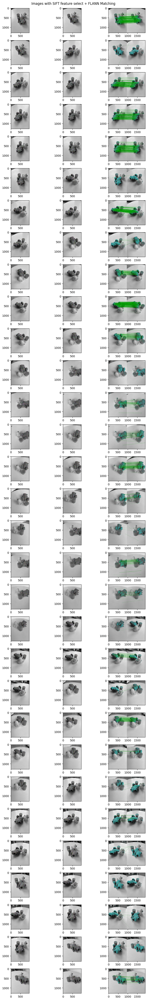

In [ ]:
files = os.listdir("./imagenes/scene/full")
fig, axs = plt.subplots(len(files)-1,3, constrained_layout = True)
for i in range(len(files)-1):
    img1 = cv.imread(f'./scene/full/{files[i]}')
    img2 = cv.imread(f'./scene/full/{files[i+1]}')

    img1, img2, Matched = FLANNFeatureMatch(img1, img2)

    axs[i,0].imshow(img1)
    axs[i,1].imshow(img2)
    axs[i,2].imshow(Matched)
fig.suptitle("Images with SIFT feature select + FLANN Matching")
fig.set_size_inches(8,50)
#fig.tight_layout()
plt.show()

## Triangulación, Matriz Fundamental y Matriz Esencial
Vamos a definir las funciones para estimar la Matriz Fundamental y la Matriz Esencial usando RANSAC.

In [ ]:
def computeFundamentalMatrix(pts1, pts2):
    """Computes the Fundamental Matrix using RANSAC."""
    F, mask = cv.findFundamentalMat(pts1, pts2, cv.FM_RANSAC, ransacReprojThreshold=1.0, confidence=0.99)
    return F, mask

def computeEssentialMatrix(pts1, pts2, K):
    """Computes the Essential Matrix using RANSAC."""
    E, mask = cv.findEssentialMat(pts1, pts2, K, method=cv.RANSAC, prob=0.999, threshold=1.0)
    return E, mask

Definimos funciones para dibujar las poses de la cámara, reconstruyendo la geometría de la escena

In [ ]:
def plot_camera_poses(camera_poses):
    """Plots the camera positions and orientations in 3D."""
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    positions = np.array([t.flatten() for _, t in camera_poses])

    ax.scatter(positions[:, 0], positions[:, 1], positions[:, 2], c='r', marker='o', label='Camera Positions')

    # Draw camera orientations
    for R, t in camera_poses:
        camera_center = t.flatten()
        x_dir = R[:, 0] * 0.1  # Scale axis
        y_dir = R[:, 1] * 0.1
        z_dir = R[:, 2] * 0.1
        ax.quiver(*camera_center, *x_dir, color='r')
        ax.quiver(*camera_center, *y_dir, color='g')
        ax.quiver(*camera_center, *z_dir, color='b')

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Camera Positions and Orientations')
    ax.legend()
    plt.show()
def plot_camera_poses2(camera_poses):
    """Creates an interactive 3D plot of the camera positions and orientations."""
    positions = np.array([t.flatten() for _, t in camera_poses])

    fig = go.Figure()
    fig.add_trace(go.Scatter3d(
        x=positions[:, 0], y=positions[:, 1], z=positions[:, 2],
        mode='markers',
        marker=dict(size=5, color='red'),
        name='Camera Positions'
    ))

    # Draw camera orientations
    for R, t in camera_poses:
        camera_center = t.flatten()
        x_dir = R[:, 0] * 0.1  # Scale axis
        y_dir = R[:, 1] * 0.1
        z_dir = R[:, 2] * 0.1

        fig.add_trace(go.Scatter3d(
            x=[camera_center[0], camera_center[0] + x_dir[0]],
            y=[camera_center[1], camera_center[1] + x_dir[1]],
            z=[camera_center[2], camera_center[2] + x_dir[2]],
            mode='lines',
            line=dict(color='red', width=3),
            name='X-axis'
        ))

        fig.add_trace(go.Scatter3d(
            x=[camera_center[0], camera_center[0] + y_dir[0]],
            y=[camera_center[1], camera_center[1] + y_dir[1]],
            z=[camera_center[2], camera_center[2] + y_dir[2]],
            mode='lines',
            line=dict(color='green', width=3),
            name='Y-axis'
        ))

        fig.add_trace(go.Scatter3d(
            x=[camera_center[0], camera_center[0] + z_dir[0]],
            y=[camera_center[1], camera_center[1] + z_dir[1]],
            z=[camera_center[2], camera_center[2] + z_dir[2]],
            mode='lines',
            line=dict(color='blue', width=3),
            name='Z-axis'
        ))

    fig.update_layout(
        scene=dict(
            xaxis_title='X',
            yaxis_title='Y',
            zaxis_title='Z'
        ),
        title='Interactive Camera Positions and Orientations'
    )

    fig.show()

Recuperación de la geometría de la Escena

In [ ]:
fundamental_matrices = []
essential_matrices = []
camera_poses = []
for i in range(len(files)-1):
    img1 = cv.imread(f'./imagenes/scene/full/{files[i]}')
    img2 = cv.imread(f'./scene/full/{files[i+1]}')

    pts1, pts2= FLANNFeatureMatch(img1, img2, MatrixEstimation=True)

    pts1 = np.array(pts1, dtype=np.float32).reshape(-1, 1, 2)
    pts2 = np.array(pts2, dtype=np.float32).reshape(-1, 1, 2)

    if len(pts1) >= 8:
        # Compute Fundamental Matrix
        F, _ = cv.findFundamentalMat(pts1, pts2, cv.FM_RANSAC)
        fundamental_matrices.append(F)

        # Compute Essential Matrix
        E, _ = cv.findEssentialMat(pts1, pts2, Imatrix, method=cv.RANSAC)
        essential_matrices.append(E)
        # Recover pose from Essential Matrix
        _, R, t, _ = cv.recoverPose(E, pts1, pts2, Imatrix)
        camera_poses.append((R, t))
        # Triangulate points for cheirality check
        P1 = Imatrix @ np.hstack((np.eye(3), np.zeros((3, 1))))  # First camera at origin
        P2 = Imatrix @ np.hstack((R, t))  # Second camera with estimated pose

        pts1_h = pts1.T
        pts2_h = pts2.T

        pts4D_hom = cv.triangulatePoints(P1, P2, pts1_h, pts2_h)
        eps = 1e-8  # Small value to avoid division by zero
        valid_mask = np.abs(pts4D_hom[3]) > 1e-6  # Avoid division by very small values
        pts3D = np.where(valid_mask, pts4D_hom[:3] / pts4D_hom[3], np.nan)  # Convert to non-homogeneous

        # Check if points are in front of both cameras
        valid_points = np.sum(pts3D[2, :] > 0)
        if valid_points > len(pts3D[2]) * 0.75:  # Ensure majority are in front
            camera_poses.append((R, t))

print(fundamental_matrices)
print(essential_matrices)
print(camera_poses)
plot_camera_poses2(camera_poses)

<ipython-input-99-e2d15217a2ec>:34: RuntimeWarning:

divide by zero encountered in divide

<ipython-input-99-e2d15217a2ec>:34: RuntimeWarning:

overflow encountered in divide

<ipython-input-99-e2d15217a2ec>:34: RuntimeWarning:

invalid value encountered in divide



[array([[ 1.86407515e-06, -4.03773947e-06,  1.68696098e-02],
       [ 6.19155893e-06,  3.02845464e-06,  1.95549800e-02],
       [-1.34625411e-02, -2.61982000e-02,  1.00000000e+00]]), array([[ 1.46944369e-06, -5.37534315e-06,  1.73072498e-03],
       [ 4.76902459e-06,  1.64167404e-06, -5.71131959e-03],
       [-3.57791102e-03,  4.30302533e-03,  1.00000000e+00]]), array([[ 1.46023951e-06, -7.38036753e-06,  3.11754354e-03],
       [ 7.44777052e-06,  2.60822566e-06, -6.40689805e-03],
       [-4.79858556e-03,  3.96348380e-03,  1.00000000e+00]]), array([[ 6.21933182e-07, -2.94037819e-06, -2.07175890e-04],
       [ 2.62295369e-06,  1.42998777e-06, -8.37243486e-03],
       [-1.74121209e-03,  7.45749637e-03,  1.00000000e+00]]), array([[ 6.15179047e-07, -2.17195196e-06,  6.00695293e-04],
       [ 1.20612507e-06,  6.35421919e-07, -4.91265393e-03],
       [-1.97346302e-03,  4.61559623e-03,  1.00000000e+00]]), array([[ 8.66673376e-07,  1.47599500e-07, -8.97922438e-04],
       [-3.47581651e-07,  1.1

## PyCOLMAP Structure from Motion

Hay que correr este código con PyCOLMAP primero ya que COLMAP como tal da error y no encuentra la base de datos de los puntos para trabajar sin antes hacerla con PyCOLMAP.

In [ ]:
image_dir = "./imagenes/scene/full"
output_path = "./scene3D"
mvs_path = "./mvs"
database_path = "./database/bd"


#Crear database con PyCOLMAP para evitar errores de directorios
pycolmap.extract_features(database_path, image_dir)

### Configurando COLMAP en COLAB con CUDA

Hacemos las respectiva instalación de COLMAP, construyendo los binarios con CUDA desde el repo para poder hacer la reconstrucción densa de la escena y definir los mapas de profundidad de cada imagen. Ponemos la condición del if para verificar si ya tenemos la reconstrucción densa de la escena en "fused.ply" para evitar correr todo el código de instalación **(SE DEMORA ALREDEDOR DE UNA HORA EN CORRER TODO EN COLAB)**. Dejamos los comandos de bash que se usaron para usar COLMAP para demostrar como lo trabajamos pero si se quiere hacer una reconstrucción local, se deberían correr uno por uno aparte.

In [ ]:
if os.path.exists("./mvs/scene_dense.xyz"):
    pcd = o3d.io.read_point_cloud("./mvs/scene_dense.xyz")
    points = np.asarray(pcd.points)
    points[:, 2] = -points[:, 2]
    # Convert to numpy array
    fig = go.Figure(data=[go.Scatter3d(
        x=points[:, 0],
        y=points[:, 1],
        z=points[:, 2],
        mode="markers",
        marker=dict(size=1, color=points[:, 2], colorscale="Jet", opacity=0.8)
    )])

    # Adjust camera view (change eye values for different angles)
    camera = dict(
        eye=dict(x=1.5, y=1.5, z=1.5)  # Adjust x, y, z for different perspectives
    )

    fig.update_layout(
        title="Reconstrucción 3D Densa con Cámara Interactiva",
        scene_camera=camera,
        autosize=True
    )

    fig.show()
else:
   !sudo apt-get install \
    git \
    cmake \
    ninja-build \
    build-essential \
    libboost-program-options-dev \
    libboost-graph-dev \
    libboost-system-dev \
    libeigen3-dev \
    libflann-dev \
    libfreeimage-dev \
    libmetis-dev \
    libgoogle-glog-dev \
    libgtest-dev \
    libgmock-dev \
    libsqlite3-dev \
    libglew-dev \
    qtbase5-dev \
    libqt5opengl5-dev \
    libcgal-dev \
    libceres-dev

   #Descargar COLMAP desde el repo y construir el binario
   !git clone https://github.com/colmap/colmap.git
   !cd colmap
   !mkdir build
   !cd build
   !cmake .. -GNinja
   !ninja
   !sudo ninja install

   #Verificar instalación de CUDA
   !colmap -h | grep "CUDA"

   # Feature Match with CUDA
   !colmap exhaustive_matcher \
    --database_path "/content/drive/MyDrive/Visión/database/bd" \
    --SiftMatching.use_gpu 1

   # Sparse Reconstruction
   !mkdir -p "/content/drive/MyDrive/Visión/scene3D/sparse"
   !colmap mapper \
      --database_path "/content/drive/MyDrive/Visión/database/bd" \
      --image_path "/content/drive/MyDrive/Visión/imagenes/scene/full" \
      --output_path "/content/drive/MyDrive/Visión/scene3D/sparse"

   # Dense Reconstruction
   !mkdir -p "/content/drive/MyDrive/Visión/mvs"
   !colmap image_undistorter \
    --image_path "/content/drive/MyDrive/Visión/imagenes/scene/full" \
    --input_path "/content/drive/MyDrive/Visión/scene3D/sparse/0" \
    --output_path "/content/drive/MyDrive/Visión/mvs" \
    --output_type COLMAP \
    --max_image_size 2000

   !colmap patch_match_stereo \
    --workspace_path "/content/drive/MyDrive/Visión/mvs" \
    --workspace_format COLMAP \
    --PatchMatchStereo.geom_consistency 1

   # Stereo Fusion
   !colmap stereo_fusion \
    --workspace_path "/content/drive/MyDrive/Visión/mvs" \
    --workspace_format COLMAP \
    --output_path "/content/drive/MyDrive/Visión/mvs/fused.ply"

   # Save as .xyz
   pcd = o3d.io.read_point_cloud("./mvs/fused.ply")
   o3d.io.write_point_cloud("scene_dense.xyz", pcd)

## Conclusiones y Retos

Al principio, la máscara que usamos para que los matches se vean bien en las imágenes es, en algunos casos, muy restrictiva y no salen las líneas que esperábamos en la parte 2 del taller. Sin embargo, esto se debe a que estos pares de imágenes tienen una diferencia en los ángulos de la cámara lo suficientemente grande como para que este filtro elimine los matches correctos.

En general, las librerías de Visión Computacional son terriblemente mañosas con las versiones. Intentamos correr VGGGSfM en local pero pedía una versión más nueva de Python que no teníamos entonces optamos por usar COLMAP. La documentación de COLMAP está bastante desorganizada y se necesita CUDA para que la reconstrucción funcione correctamente. Hicimos varias pruebas donde hacíamos solamente stereo_fusion con los puntos que salían de la sparse reconstruction pero no generaba ninguna nube de puntos con la reconstrucción 3D. Optamos por usar COLMAP en Colab para ahorrarnos problemas con algunos paquetes que necesitaba COLMAP y que no encontraba en la instalación. Además, Colab tiene GPUs con CUDA entonces el procesamiento es **SIGNIFICATIVAMENTE** más rápido. La dificultada aquí fue la instalación de alrededor de 30 minutos de COLMAP en Colab. Descargar el archivo ply con la reconstrucción para visualizarlo en local lo corrompe. Fue necesario guardar el archivo en formato .xyz para poder descargarlo.